# Decoding mouse from session sequences


In [20]:
prefix = '/home/ines/repositories/'
prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [21]:
""" 
IMPORTS
"""
import os
import autograd.numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# --Machine learning and statistics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,  LabelBinarizer
from sklearn.cluster import KMeans
import random
from sklearn import mixture
import pickle
from scipy.stats import mode
from sklearn.inspection import permutation_importance

# --Machine learning and statistics
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import entropy

# Get my functions
functions_path =  prefix + 'representation_learning_variability/Functions/'
os.chdir(functions_path)
from data_processing import save_and_log
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//2_fit_models/'
os.chdir(functions_path)
from preprocessing_functions import idxs_from_files
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//3_postprocess_results/'
os.chdir(functions_path)
from plotting_functions import create_grouped_gradient_palette

from one.api import ONE
one = ONE(mode='remote')

## Parameters

In [22]:
# Parameters
bin_size = 0.017
num_states = 2
threshold = 0.0
optimal_k = 4

save_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'

# LOAD DATA
data_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Design matrix/' + 'v5_15Jan2025/' + str(bin_size) + '/'
all_files = os.listdir(data_path)
design_matrices = [item for item in all_files if 'design_matrix' in item and 'standardized' not in item]
idxs, mouse_names = idxs_from_files(design_matrices, bin_size)

states_path =  prefix + 'representation_learning_variability/DATA/Sub-trial/Results/' + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'
wavelet_states_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/wavelet_transform_states/'

path_sets = [wavelet_states_path, states_path, states_path]


# Individual sessions

In [23]:
# Identify sessions available to process
sessions_to_process = []
for m, mat in enumerate(idxs):
    mouse_name = mat[37:]
    session = mat[:36]
    fit_id = str(mouse_name + session)
    whisker_filename = os.path.join(states_path, "most_likely_states" + 'whisker_me' + '_' + fit_id)
    licks_filename = os.path.join(states_path, "most_likely_states" + 'Lick count' + '_' + fit_id)
    wavelet_filename = os.path.join(wavelet_states_path, "most_likely_states_" + str(optimal_k) + '_' + fit_id)

    if os.path.exists(whisker_filename) and os.path.exists(licks_filename) and os.path.exists(wavelet_filename):
        sessions_to_process.append((mouse_name, session))

print(f"Found {len(sessions_to_process)} sessions to process.")

Found 215 sessions to process.


## Get sequences per trial epoch

In [24]:
results_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/1_HMM_states/'
filename = str(results_path + 'epoch_sequences_10_03-11-2025')
all_sequences = pickle.load(open(filename, 'rb'))

In [25]:
design_df = all_sequences.pivot(index=['sample', 'trial_type', 'mouse_name'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
var_names = design_df.keys()[-4:]

In [7]:
df = design_df.copy()
df['feedback'] = df['trial_type'].str.split().str[:1].str.join('')
df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df['block'] = df['trial_type'].str.split().str[2:3].str.join('')
df['contrast'] = df['trial_type'].str.split().str[1:2].str.join('')
df['side'] = df['choice'].copy()
df.loc[(df['feedback']=='correct') & (df['choice']=='right'), 'side'] = 'left'
df.loc[(df['feedback']=='correct') & (df['choice']=='left'), 'side'] = 'right'

df['session'] = df['sample'].str.split().str[:1].str.join('')
df['trial_id'] = df['sample'].str.split().str[1:2].str.join('')

df['contrast'] = df['contrast'].astype(float)
df['block'] = df['block'].astype(float)

df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df.loc[df['choice']=='left', 'choice'] = 0
df.loc[df['choice']=='right', 'choice'] = 1

df.loc[df['feedback']=='correct', 'feedback'] = 1
df.loc[df['feedback']=='incorrect', 'feedback'] = 0

## Get metadata

In [14]:
sessions = df.session.unique()

metadata = pd.DataFrame(columns=['session', 'lab', 'rig', 'users'], index=range(len(sessions)))
for s, session in enumerate(sessions):
    try:
        session_details = one.get_details(session, full=True)

        metadata['session'][s] = session
        metadata['lab'][s] = session_details['lab']
        metadata['rig'][s] = session_details['location']
        metadata['users'][s] = session_details['users']
    except:
        print(session)

/tmp/ipykernel_10573/2615688291.py:8: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  metadata['session'][s] = session
/tmp/ipykernel_10573/2615688291.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are se

251ece37-7798-477c-8a06-2845d4aa270c


In [24]:
file_to_save = metadata.copy()
filename = "metadata"
save_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/6_Mouse_decoding/'
file_format = 'parquet'
script_name = '4.6.2_mouse_decoder.ipynb'
meta = save_and_log(file_to_save, filename, file_format, save_path, script_name)

## Get learning speed

In [ ]:
data_path = prefix + 'representation_learning_variability/DATA/'
# data_path =  '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/DATA/'
learning_df = pd.read_csv(data_path+'learning_private_one.csv')  
learning_times = learning_df[['subject_nickname', 'training_time']].drop_duplicates()
learning_times = learning_times.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

data_path =  prefix + 'representation_learning_variability/DATA/'
learning_df = pd.read_parquet(data_path+'training_time_03-21-2025', engine='pyarrow')
learning_times_new = learning_df.rename(columns={"subject_nickname": "mouse_name"}).reset_index()

# new_df = design_df.droplevel(1, axis=1)[['mouse_name', 'session']]
# df = new_df.merge(learning_times, on='mouse_name')
a = learning_times.merge(learning_times_new, on='mouse_name', how='outer')
b = a.loc[a['training_time_x'].isna()]
b = b.rename(columns={"training_time_y": "training_time"}).reset_index()

full_learning = pd.concat([learning_times[['mouse_name', 'training_time']], b[['mouse_name', 'training_time']]]).reset_index()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_73598/3750467177.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  learning_df = pd.read_csv(data_path+'learning_private_one.csv')


In [ ]:
df =df.merge(learning_times_new, on=['mouse_name'])
df['quartile'] = pd.qcut(df['training_time'], q=[0, .25, .5, .75, 1], labels=[1, 2, 3, 4])

In [30]:
df = df.merge(metadata, on=['session'])

## Get session part' sequences

In [9]:
results_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/'

trials_filename = str(results_path + 'cluster_per_trial_part_info03-21-2025')
trial_clusters = pd.read_parquet(trials_filename, engine='pyarrow')
parts_filename = str(results_path + 'cluster_per_session_part03-21-2025')
parts_clusters = pd.read_parquet(parts_filename, engine='pyarrow')

In [8]:
df = parts_clusters[['sample', 'mouse_name', 'part_cluster', 'UMAP1', 'UMAP2']].drop_duplicates()
df['part'] = df['sample'].str.split().str[1:2].str.join('')


In [9]:
session_num = df.groupby(['mouse_name'])['part'].count()
use_data = df[['mouse_name', 'UMAP1', 'UMAP2', 'part_cluster']].merge(session_num.reset_index(), on='mouse_name')


In [10]:
plot = False
target_length = 3

all_sequences = pd.DataFrame(columns=['sample', 'mouse_name', 'trial_type', 'cluster', 'bin'])
for s, sample in enumerate(trial_clusters['sample'].unique()):

    # Get session data and order trials
    session_data = trial_clusters.loc[trial_clusters['sample']==sample]
    session_data = session_data[['sample', 'mouse_name', 'trial_id', 'trial_type', 'cluster']].drop_duplicates()
    session_data['trial_id'] = session_data['trial_id'].astype(float)
    session_data = session_data.sort_values(by=['trial_id'])

    # Bin 
    n_trials = len(session_data)
    # Assign bin index: split into 10 parts
    bin_indices = pd.qcut(np.arange(n_trials), q=target_length, labels=False)
    session_data['bin'] = bin_indices
      
    all_sequences = pd.concat([all_sequences, session_data[['sample', 'mouse_name',
                                                            'trial_type', 'cluster', 'bin']]], ignore_index=True)

In [11]:
fractions = all_sequences.groupby(['sample', 'mouse_name',
                                   'bin'])['cluster'].value_counts(normalize=True).rename('fraction').reset_index().sort_values(by=['bin', 'cluster'])


,sample,mouse_name,bin,cluster,fraction
5,03063955-2523-47bd-ae57-f7489dd40f15 0.0,SWC_038,0,0,0.083333
25,03063955-2523-47bd-ae57-f7489dd40f15 1.0,SWC_038,0,0,0.111111
47,032452e9-1886-449d-9c13-0f192572e19f 0.0,SWC_053,0,0,0.044118
66,032452e9-1886-449d-9c13-0f192572e19f 1.0,SWC_053,0,0,0.104478
86,034e726f-b35f-41e0-8d6c-a22cc32391fb 0.0,CSHL045,0,0,0.154639
...,...,...,...,...,...
8115,fc43390d-457e-463a-9fd4-b94a0a8b48f5 1.0,NYU-47,2,6,0.114583
8132,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 0.0,CSH_ZAD_025,2,6,0.202532
8151,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 1.0,CSH_ZAD_025,2,6,0.197452
8171,ff96bfe1-d925-4553-94b5-bf8297adf259 0.0,ibl_witten_26,2,6,0.200000


In [12]:
design_df = fractions.pivot(index=['mouse_name', 'sample'], columns=['bin', 'cluster'], values='fraction').reset_index().fillna(0)
var_names = design_df.keys()[2:]
final_matrix = design_df[var_names]

([<matplotlib.axis.XTick at 0x7754128f7490>], [Text(0, 0, '0')])

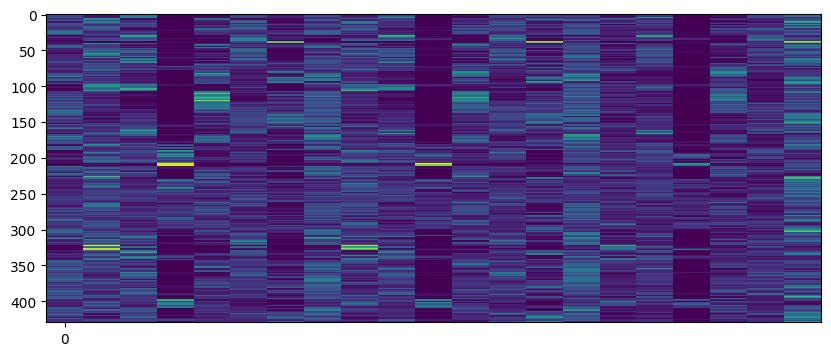

In [13]:
plt.figure(figsize=(10, 4))
plt.imshow(final_matrix, aspect='auto', cmap='viridis', interpolation='none')
plt.xticks(np.arange(0, np.shape(final_matrix)[1], 160), np.arange(0, np.shape(final_matrix)[1], 160))

# Get data of interest for decoder

In [26]:
def split_sessions(trial_clusters, n_parts):

    rng = np.random.default_rng() 

    trial_clusters['session_part'] = trial_clusters['response'] * np.nan

    for s, session in enumerate(trial_clusters.session.unique()):
        session_df = trial_clusters.loc[trial_clusters['session']==session]
        n_trials = len(session_df)
        # Create shuffled labels for parts
        parts = np.tile(np.arange(n_parts), int(np.ceil(n_trials / n_parts)))[:n_trials]
        rng.shuffle(parts)  # Shuffle to randomize assignment
        # els.extend(parts)
        trial_clusters.loc[trial_clusters['session']==session, 'session_part'] = parts

    # Assign to new column
    trial_clusters['session_part'] = trial_clusters['session_part'].astype(str)
    trial_clusters = trial_clusters.rename(columns={"sample": "old_sample"})
    trial_clusters['sample'] = trial_clusters[['session', 'session_part']].agg(' '.join, axis=1)
    
    split_session_df = trial_clusters.copy()
    
    return split_session_df


def get_fraction_vectors(trial_clusters, target_length):

    all_sequences = pd.DataFrame(columns=['sample', 'mouse_name', 'session', 'trial_type', 'cluster', 'bin'])
    for s, sample in enumerate(trial_clusters['sample'].unique()):

        # Get session data and order trials
        session_data = trial_clusters.loc[trial_clusters['sample']==sample]
        session_data = session_data[['sample', 'mouse_name', 'session', 'trial_id', 'trial_type', 'cluster']].drop_duplicates()
        session_data['trial_id'] = session_data['trial_id'].astype(float)
        session_data = session_data.sort_values(by=['trial_id'])

        # Bin 
        n_trials = len(session_data)
        # Assign bin index: split into 10 parts
        bin_indices = pd.qcut(np.arange(n_trials), q=target_length, labels=False)
        session_data['bin'] = bin_indices
        
        all_sequences = pd.concat([all_sequences, session_data[['sample', 'mouse_name', 'session', 
                                                                'trial_type', 'cluster', 'bin']]], ignore_index=True)

    fractions = all_sequences.groupby(['sample', 'mouse_name', 'session',
                                    'bin'])['cluster'].value_counts(normalize=True).rename('fraction').reset_index().sort_values(by=['bin', 'cluster'])
    design_df = fractions.pivot(index=['mouse_name', 'sample', 'session'], columns=['bin', 'cluster'], values='fraction').reset_index().fillna(0)

    return design_df
    
    
def prepare_design_mat(design_df):
    decoded_var = 'mouse_name'
    var = 'fact_var'

    mat = pd.DataFrame(design_df)
    mat['fact_var'] = pd.factorize(design_df[decoded_var])[0]
    mat[decoded_var] = design_df[decoded_var]

    use_labels = mat['fact_var'].unique()

    session_mouse_names = mat.loc[mat['fact_var'].isin(use_labels), decoded_var]
    session_names = pd.factorize(design_df['session'])[0]
    named_labels = mat.loc[mat['fact_var'].isin(use_labels), decoded_var].drop_duplicates()
    use_mat_pre = mat.loc[mat['fact_var'].isin(use_labels)]
    array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
    use_mat = pd.DataFrame(array_mat[:, :-1])
    use_mat[var] = use_mat_pre[var]
    
    return use_mat, named_labels, session_mouse_names, session_names 

## Decode mouse

In [27]:
def plot_cm(decoding_result, trial_epochs, size, control=False):
    """
    PLOT RESULTS
    """

    # -- Confusion Matrix
    # labels = trial_epochs

    # Results on original model
    plt.rc('font', size=9) 
    plt.figure(figsize=size)
    hmap = sns.color_palette("mako", as_cmap=True)
    data = decoding_result.loc[decoding_result['shuffle'] == 0]
    sns.heatmap(data['confusion_matrix'].mean(), annot=False, square=True,
        yticklabels=trial_epochs, xticklabels=trial_epochs, 
        cmap= hmap, vmin=0, vmax=1, fmt=".2f") 

    # plt.xticks([.5, 1.5, 2.5, 3.5], trial_epochs)
    # plt.yticks([.5, 1.5, 2.5, 3.5], trial_epochs)
    plt.xticks(rotation = 90)
    plt.yticks(rotation = 0)
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.savefig('full_cm.svg',dpi=500)
    plt.show()
    print('F1 results', data['f1'].mean())

    if control:
        # Results from shuffled model
        plt.rc('font', size=9) 
        plt.figure(figsize=size)
        data = decoding_result.loc[decoding_result['shuffle'] >0]
        sns.heatmap(data['confusion_matrix'].mean(), annot=False, square=True,
            yticklabels=trial_epochs, xticklabels=trial_epochs, 
            cmap= hmap, vmin=0, vmax=1, fmt=".2f")

        # plt.xticks([.5, 1.5, 2.5, 3.5], trial_epochs)
        # plt.yticks([.5, 1.5, 2.5, 3.5], trial_epochs)
        plt.xticks(rotation = 90)
        plt.yticks(rotation = 0)
        plt.xlabel('Predicted label')
        plt.ylabel('True label')
        plt.show()
        print('F1 shuffled results',  data['f1'].mean())
    plt.tight_layout()

def plot_f1(decoding_result):
    # -- F1 score per model, original and shuffled
    data = decoding_result.copy()
    data['f1'] = data['f1'].astype(float)

    data.loc[data['shuffle'] >= 1, 'shuffle'] = 'Shuffled'
    data.loc[data['shuffle'] == 0, 'shuffle'] = 'Original'
    data = data.rename(columns={'shuffle': 'Dataset'})

    plt.rc('font', size=12) 
    plt.figure(figsize=[4.5, 4])
    sns.boxplot(y='f1', x='Dataset', data=data, color='grey') 
    sns.swarmplot(y='f1', x='Dataset', data=data, color='black', dodge=True, alpha=0.7, size=3)
    plt.ylim([0,1])
    plt.ylabel('Accuracy score (F1)')
    plt.legend(bbox_to_anchor=(1.05, 1))
    sns.despine(top=True, right=True)
    #plt.savefig('violin.svg',dpi=500)
    

In [28]:
shufflings = 1 #shuffling
repeats = 200
model = RandomForestClassifier(random_state=42)
# model = MultinomialNB()

n_parts = 2  # Only 2 parts to make sure session patterns are preserved
target_length = 3
var = 'fact_var'
fold_splits = 20

In [29]:
"""
RUN MODEL
"""

# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results


decoding_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix', 'pairwise_matrix', 'importances'])
dec_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix', 'pairwise_matrix', 'importances'])

session_success = pd.DataFrame(columns=['session', 'success_count'])
session_count = 0

for r in range(repeats):
    print('Repeat %d of %d' % (r+1, repeats))  
        
    # Split data anew
    split_session_df = split_sessions(trial_clusters, n_parts)
    design_df = get_fraction_vectors(split_session_df, target_length)
    design_df = get_fraction_vectors(trial_clusters, target_length)
    use_mat, named_labels, session_mouse_names, session_names = prepare_design_mat(design_df)
    if r == 0:
        session_success['session'] = np.unique(session_names)
        session_success['success_count'] = 0

    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=fold_splits, shuffle=True, random_state=0)
    # use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index']).copy()
    use_sessions = session_names[use_index]
    # -- ORIGINAL DATASET

    # dec_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix'])
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()
    # endog[:] = replace_func(endog)

    iter_importances = np.zeros((fold_splits, np.shape(exog)[1])) * np.nan
    fold = 0
    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        # model.fit(exog.iloc[train_index], endog.iloc[train_index])
        y_pred[test_index] = model.predict(exog.iloc[test_index])

        mdi_importances = pd.Series(model[-1].feature_importances_) 
        iter_importances[fold, :] = np.array(mdi_importances)
        fold = fold +1

    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')
    
    pairwise_matrix = np.zeros((np.shape(use_mat)[0], np.shape(use_mat)[0])) * np.nan
    y_true = np.array(endog.astype(int))
    pairwise_matrix[np.ix_(use_index, use_index)] = y_pred[:, None] == y_true[None, :]
    # plt.imshow(pairwise_matrix)
    # plt.show()

    # Save sessions with successful classification
    success_sessions_list = endog.astype(int) == y_pred.astype('int')
    # session_success.loc[session_success['session'].isin(success_sessions_count), 'success_count'] = +1  # TODO this is not completely right, 

    success_indices = use_sessions[success_sessions_list]
    success_counts = session_success.loc[success_indices].groupby('session').size()
    session_success['success_count'].iloc[np.unique(success_indices)] = session_success['success_count'].iloc[np.unique(success_indices)] + success_counts  # TODO this is not completely right, 

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'pairwise_matrix'] = pairwise_matrix
    dec_result.loc[0, 'shuffle'] = 0
    dec_result.loc[0, 'repeat'] = r
    dec_result.loc[0, 'importances'] = iter_importances

    decoding_result = pd.concat([decoding_result, dec_result])

    # -- SHUFFLED DATASET 
    shuffle_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix', 'pairwise_matrix', 'importances'])
    for s in range(shufflings):
        if np.mod(s+1, 10) == 0:
            print('Shuffling %d of %d' % (s+1, shufflings))   

        shuffle_y_pred = np.zeros(len(new_mat), dtype=int) 
        shuffle_endog = endog.copy()
        np.random.shuffle(shuffle_endog.values)

        for train_index, test_index in kf.split(new_mat):
            model.fit(exog.iloc[train_index], list(shuffle_endog.iloc[train_index].astype(int)))
            shuffle_y_pred[test_index] = model.predict(exog.iloc[test_index])   

        shuffle_f1 = f1_score(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), average='micro')
        shuffle_cm = confusion_matrix(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), normalize='true')

        # SAVE
        shuffle_result.loc[s, 'f1'] = shuffle_f1
        shuffle_result.loc[s, 'confusion_matrix'] = shuffle_cm
        shuffle_result.loc[s, 'shuffle'] = s + 1
        shuffle_result.loc[s, 'repeat'] = r

    decoding_result = pd.concat([decoding_result, shuffle_result])

Repeat 1 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 2 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 3 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 4 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 5 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 6 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 7 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 8 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 9 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 10 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 11 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 12 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 13 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 14 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 15 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 16 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 17 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 18 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 19 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 20 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 21 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 22 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 23 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 24 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 25 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 26 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 27 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 28 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 29 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 30 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 31 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 32 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 33 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 34 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 35 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 36 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 37 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 38 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 39 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 40 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 41 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 42 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 43 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 44 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 45 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 46 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 47 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 48 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 49 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 50 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 51 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 52 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 53 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 54 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 55 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 56 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 57 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 58 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 59 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 60 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 61 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 62 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 63 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 64 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 65 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 66 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 67 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 68 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 69 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 70 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 71 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 72 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 73 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 74 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 75 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 76 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 77 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 78 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 79 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 80 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 81 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 82 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 83 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 84 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 85 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 86 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 87 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 88 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 89 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 90 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 91 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 92 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 93 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 94 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 95 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 96 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 97 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 98 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 99 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 100 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 101 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 102 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 103 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 104 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 105 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 106 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 107 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 108 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 109 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 110 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 111 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 112 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 113 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 114 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 115 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 116 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 117 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 118 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 119 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 120 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 121 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 122 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 123 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 124 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 125 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 126 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 127 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 128 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 129 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 130 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 131 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 132 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 133 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 134 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 135 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 136 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 137 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 138 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 139 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 140 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 141 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 142 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 143 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 144 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 145 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 146 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 147 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 148 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 149 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 150 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 151 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 152 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 153 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 154 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 155 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 156 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 157 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 158 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 159 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 160 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 161 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 162 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 163 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 164 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 165 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 166 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 167 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 168 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 169 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 170 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 171 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 172 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 173 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 174 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 175 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 176 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 177 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 178 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 179 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 180 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 181 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 182 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 183 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 184 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 185 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 186 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 187 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 188 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 189 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 190 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 191 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 192 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 193 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 194 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 195 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 196 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 197 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 198 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 199 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

Repeat 200 of 200


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/607950693.py:67: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  array_mat = np.array(use_mat_pre.drop(columns=[decoded_var, 'sample', 'session']))
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/1630288024.py:80: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updati

In [31]:
file_to_save = decoding_result.copy()
filename = "decoding_results_200_reps"
save_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/6_Mouse_decoding/'
file_format = 'pickle'
script_name = '6.2_mouse_decoder.ipynb'
meta = save_and_log(file_to_save, filename, file_format, save_path, script_name)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_53043/895160246.py:1: RuntimeWarning: Mean of empty slice
  avg_pariwise = np.nanmean(np.stack(decoding_result.loc[decoding_result['shuffle']==0].reset_index()['pairwise_matrix']), axis=0)


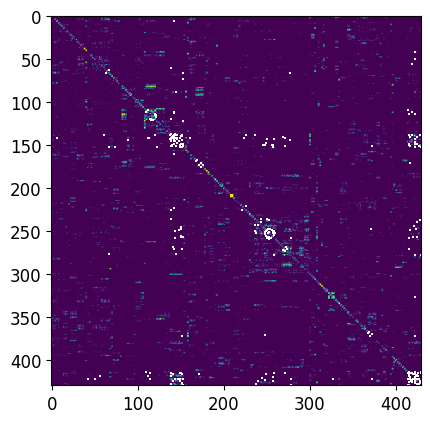

In [18]:
avg_pariwise = np.nanmean(np.stack(decoding_result.loc[decoding_result['shuffle']==0].reset_index()['pairwise_matrix']), axis=0)
plt.imshow(avg_pariwise)

/tmp/ipykernel_19665/895160246.py:1: RuntimeWarning: Mean of empty slice
  avg_pariwise = np.nanmean(np.stack(decoding_result.loc[decoding_result['shuffle']==0].reset_index()['pairwise_matrix']), axis=0)


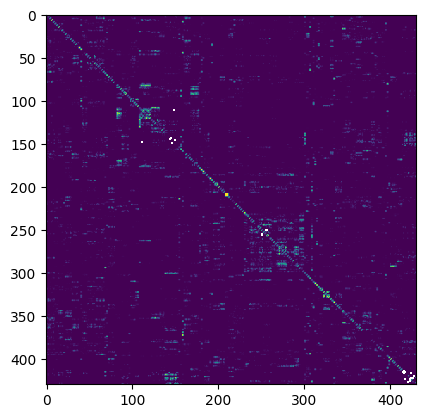

In [19]:
avg_pariwise = np.nanmean(np.stack(decoding_result.loc[decoding_result['shuffle']==0].reset_index()['pairwise_matrix']), axis=0)
plt.imshow(avg_pariwise)

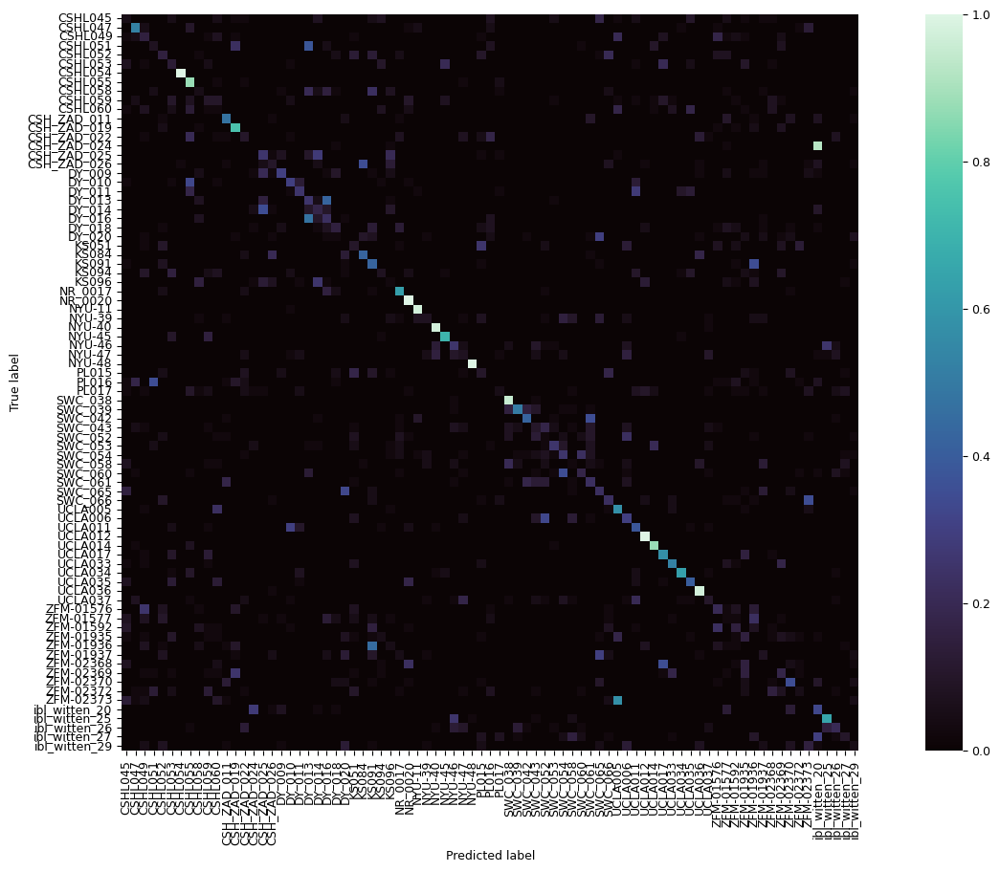

F1 results 0.31512345679012344


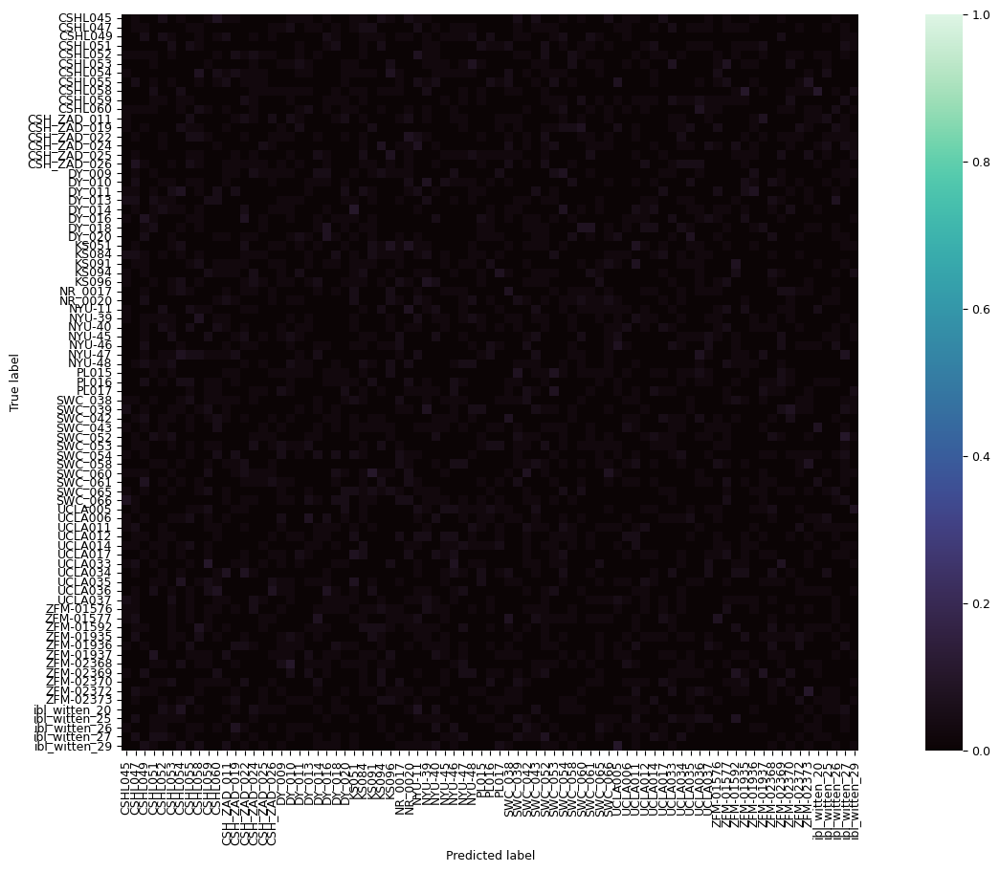

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored w

F1 shuffled results 0.005246913580246914
0     inf
0     inf
0     inf
0     inf
0     inf
0     inf
0    23.5
0    16.0
0    26.5
0     inf
0     inf
0     inf
0    25.5
0     inf
0    28.0
0    58.0
0    49.0
0    26.0
0    47.0
0    53.0
Name: f1, dtype: object


<Figure size 640x480 with 0 Axes>

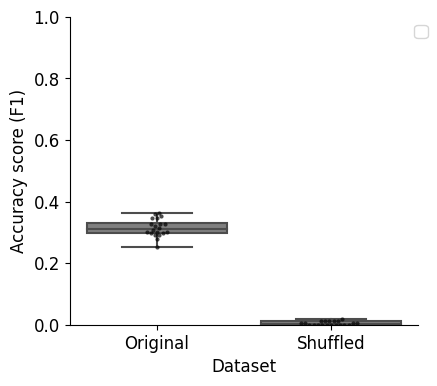

In [15]:
plot_cm(decoding_result, named_labels, [18, 10], control=True)
plot_f1(decoding_result)
decoding_ratio = decoding_result.loc[decoding_result['shuffle']==0, 'f1']/decoding_result.loc[decoding_result['shuffle']==1, 'f1']
print(decoding_ratio)

## Compute importances

In [21]:
use_states = 7
timesteps = target_length
reshaped_importances = np.zeros((use_states, timesteps)) * np.nan
reshaped_importances = pd.DataFrame(columns=['mode', 'timestep', 'importance', 'repeat'])

for r in range(repeats):
    importance_df = pd.DataFrame(columns=['mode', 'timestep', 'importance', 'repeat'], index=range(use_states * timesteps))
    for t in range(timesteps):
        mdi_importances = decoding_result.loc[(decoding_result['shuffle']==0) &
                                                    (decoding_result['repeat']==r), 'importances']
        importances = np.mean(mdi_importances[0], axis=0)
        importance_df['mode'][t*use_states:(t+1)*use_states] = ['0', '1', '2', '3', '4', '5', '6']
        importance_df['timestep'][t*use_states:(t+1)*use_states] = t
        importance_df['importance'][t*use_states:(t+1)*use_states] = importances[t*use_states:(t+1)*use_states]
        importance_df['repeat'][t*use_states:(t+1)*use_states] = r
    reshaped_importances = pd.concat([reshaped_importances, importance_df])

/tmp/ipykernel_19665/1813874763.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  importance_df['mode'][t*use_states:(t+1)*use_states] = ['0', '1', '2', '3', '4', '5', '6']
/tmp/ipykernel_19665/1813874763.py:13: FutureWarning: ChainedAssi

ValueError: setting an array element with a sequence.

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with 

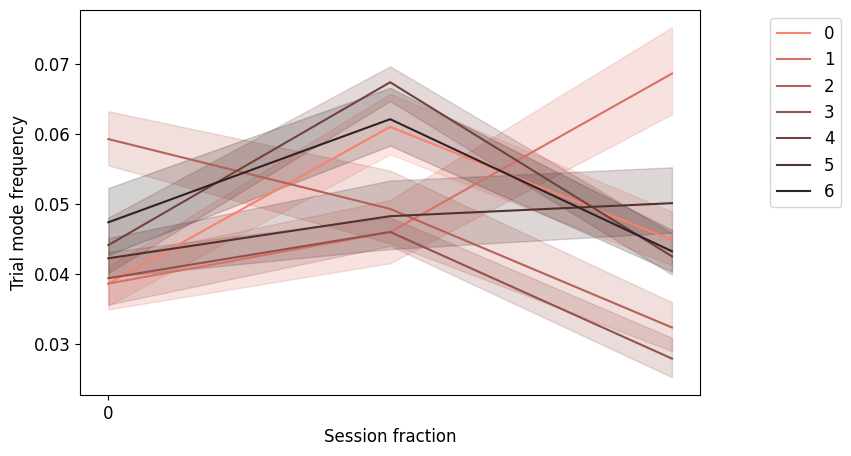

In [133]:
palette = sns.color_palette("dark:salmon_r", 7, as_cmap=False)
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.color_palette(palette).as_hex())

fig, axs = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8, 5))

sns.lineplot(x='timestep', y='importance', hue='mode', data=reshaped_importances, 
             ax=axs, palette=palette)
axs.legend(loc='upper left', bbox_to_anchor=(1.1, 1))
axs.set_ylabel('Trial mode frequency')
axs.set_xlabel('Session fraction')
axs.set_xticks(np.arange(0, 1, 2),np.arange(0, 1, 2))

## Compute pairwise distances

In [22]:
session_vectors = use_mat.copy()
session_vectors['mouse_name'] = session_mouse_names


In [65]:
distance_matrix = decoding_result.loc[decoding_result['shuffle'] == 0, 'confusion_matrix'].mean()

# Alternatively, take session-level matrix
pairwise_matrix = np.nanmean(np.stack(decoding_result.loc[decoding_result['shuffle']==0].reset_index()['pairwise_matrix']), axis=0)
not_nan = ~np.isnan(np.mean(pairwise_matrix, axis=0)) # Find nans collapsed in one dimension
distance_matrix = pairwise_matrix[np.ix_(not_nan, not_nan)] 

use_labels = labels[not_nan]
use_mouse_name_labels = session_mouse_names[not_nan]

/tmp/ipykernel_19665/2179725038.py:4: RuntimeWarning: Mean of empty slice
  pairwise_matrix = np.nanmean(np.stack(decoding_result.loc[decoding_result['shuffle']==0].reset_index()['pairwise_matrix']), axis=0)


In [66]:
from scipy.spatial.distance import pdist, squareform

# Use cosine distance (1 - cosine similarity)
C_sym = (distance_matrix + distance_matrix.T) / 2
dist_matrix = squareform(pdist(C_sym, metric='cosine'))  # varies between zero and 1

## Analyse within-mouse distances

In [125]:
mouse_avg_pairwise = np.zeros(len(np.unique(labels)))

for m in range(len(np.unique(mouse_names))):
    use_idx = np.where(use_labels == m)[0]
    mouse_avg_pairwise[m] = np.nanmean(dist_matrix[np.ix_(use_idx, use_idx)])

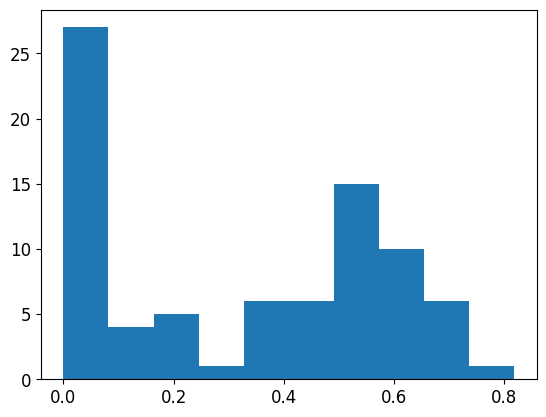

<Axes: xlabel='session_count', ylabel='distance'>

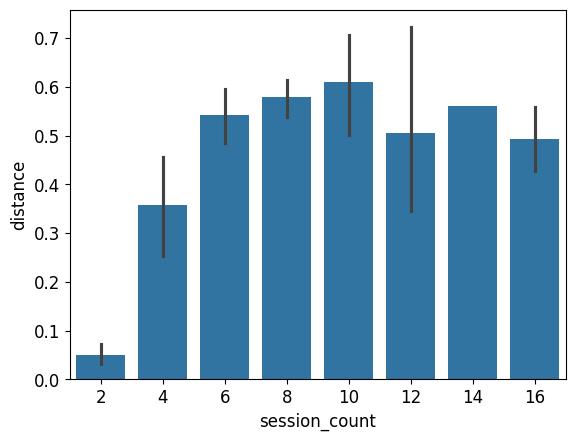

In [141]:
meta_df = pd.DataFrame({'mouse_number':labels})
meta_df['session_count'] = meta_df['mouse_number']*0+1
meta_df = meta_df.groupby(['mouse_number'])['session_count'].count().reset_index()
meta_df['distance'] = mouse_avg_pairwise
meta_df['mouse_name'] = use_mouse_name_labels.drop_duplicates().reset_index()['mouse_name']

plt.hist(mouse_avg_pairwise)
plt.show()
sns.barplot(x='session_count', y='distance', data=meta_df)

#### Correlate error similarity and cluster entropy

In [127]:
results_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/'

trials_filename = str(results_path + 'entropy03-21-2025')
entropy = pd.read_parquet(trials_filename, engine='pyarrow')

In [148]:
merged_df = entropy.merge(meta_df, on='mouse_name')

In [167]:
m, c = np.linalg.lstsq(X, y)[0]

/tmp/ipykernel_19665/1606561780.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m, c = np.linalg.lstsq(X, y)[0]


(0.388021278904525, 9.375269319473906e-05)


/tmp/ipykernel_19665/2034904256.py:15: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m, c = np.linalg.lstsq(X, y)[0]


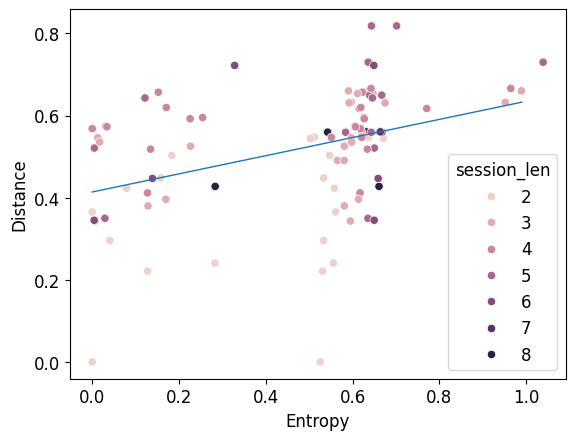

In [171]:
use_data = merged_df.loc[merged_df['session_len']>1]
# use_data = merged_df
sns.scatterplot(x='value', y='distance', hue='session_len', data=use_data)
plt.xlabel('Entropy')
plt.ylabel('Distance')
from scipy import stats
from sklearn.linear_model import LinearRegression
x = use_data['value']
y = use_data['distance']
res = stats.pearsonr(x, y)
print(res)
X = np.vstack([x, np.ones(len(x))]).T
ols = LinearRegression(fit_intercept=True)
ols.fit(np.array(X), np.array(y))
m, c = np.linalg.lstsq(X, y)[0]

new_x = np.arange(0, 1, 0.01)
# new_X = np.vstack([new_x, np.ones(len(new_x))]).T
plt.plot(
    new_x,
    m* new_x + c,
    label="Linear Regression Model",
    linewidth=1,
)

## Cluster based on errors

/tmp/ipykernel_19665/132825490.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='complete')  # You can also try 'complete', 'ward', etc.


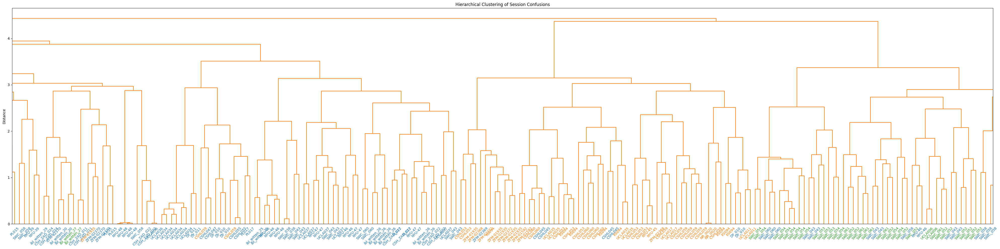

In [27]:
k = 3

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='complete')  # You can also try 'complete', 'ward', etc.

from scipy.cluster.hierarchy import ward, fcluster
clusters = fcluster(Z, t=k, criterion='maxclust')
clusters = clusters - 1


# Plot dendrogram
fig, ax = plt.subplots(figsize=(40, 10))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("tab10", k, as_cmap=True))
# cmap = plt.get_cmap(sns.color_palette(k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}

# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=np.array(use_mouse_name_labels), leaf_font_size=10, 
                    ax=ax, leaf_rotation=45, color_threshold=100)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[use_mouse_name_labels.astype(str)==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.title("Hierarchical Clustering of Session Confusions")
plt.ylabel("Distance")
plt.tight_layout()
plt.xlim([2000, 4000])
plt.show()

NameError: name 'dist_matrix' is not defined

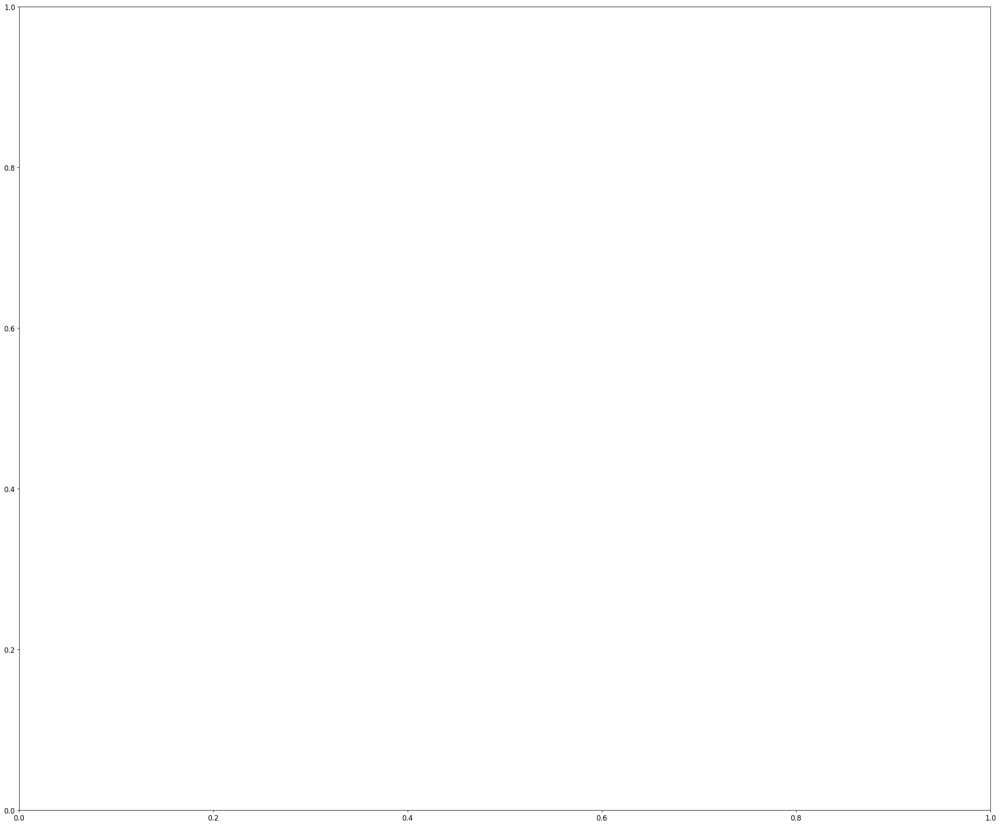

In [19]:
fig, ax = plt.subplots(figsize=[30, 25])
ax.imshow(dist_matrix)

plt.xticks(np.arange(0, len(use_labels)), np.array(use_mouse_name_labels))
plt.yticks(np.arange(0, len(use_labels)), np.array(use_mouse_name_labels))
for m_lines in np.where(np.diff(use_labels)==1):
    plt.vlines(m_lines+.5, 0, len(use_labels), color='k')
    plt.hlines(m_lines+.5, 0, len(use_labels), color='k')
plt.xticks(rotation = 90)
plt.yticks(rotation = 0)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[use_mouse_name_labels.astype(str)==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])
    
y_labels = ax.get_ymajorticklabels()
counter = 0
for lbl in y_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[use_mouse_name_labels.astype(str)==mouse_id][0]
    # lbl.set_color(cluster_colors[cluster_id])

plt.xlim([np.shape(dist_matrix)[0], 0])
plt.ylim([0, np.shape(dist_matrix)[0]])
# plt.xlim([200, 0])
# plt.ylim([0, 200])

plt.tight_layout()

ValueError: The number of FixedLocator locations (81), usually from a call to set_ticks, does not match the number of labels (430).

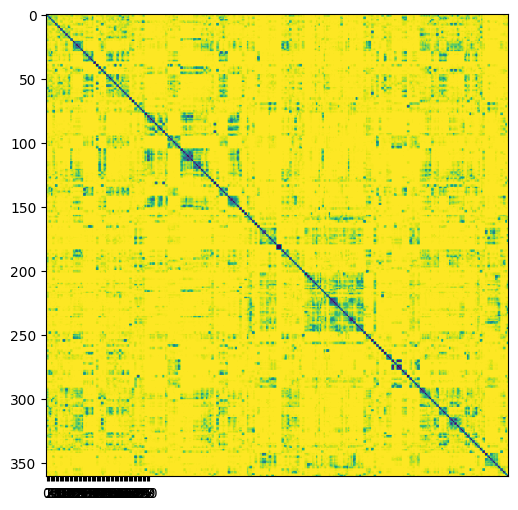

In [98]:
# Mice distance matrix
plt.figure(figsize=[10, 6])
plt.imshow(dist_matrix)
plt.xticks(np.arange(0, 81), np.array(named_labels))
plt.yticks(np.arange(0, 81), np.array(named_labels))
plt.xticks(rotation = 90)
plt.yticks(rotation = 0)
plt.tight_layout()

/tmp/ipykernel_21208/3206983879.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.


IndexError: boolean index did not match indexed array along dimension 0; dimension is 361 but corresponding boolean dimension is 81

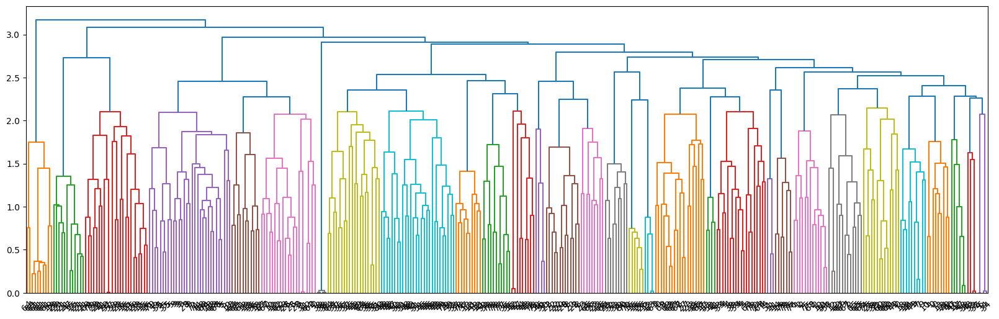

In [184]:
k = 8

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.

from scipy.cluster.hierarchy import ward, fcluster
clusters = fcluster(Z, t=k, criterion='maxclust')
clusters = clusters - 1


# Plot dendrogram
fig, ax = plt.subplots(figsize=(20, 6))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("tab10", k, as_cmap=True))
# cmap = plt.get_cmap(sns.color_palette(k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}

# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=np.array(use_labels), leaf_font_size=10, ax=ax, leaf_rotation=45)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[named_labels==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.title("Hierarchical Clustering of Mouse Confusions")
plt.ylabel("Distance")
plt.tight_layout()

plt.show()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_99228/2009588820.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/scipy/cluster/hierarchy.py:833: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


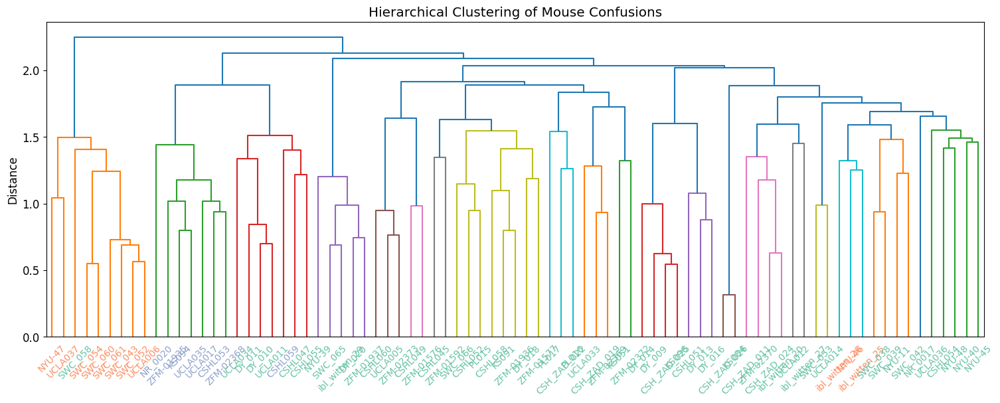

In [61]:
k = 3

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.

from sklearn.cluster import AgglomerativeClustering

clustering = AgglomerativeClustering(n_clusters=k).fit(dist_matrix)
clusters = clustering.labels_

# Plot dendrogram
fig, ax = plt.subplots(figsize=(15, 6))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("Set2", k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}


# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=np.array(named_labels), leaf_font_size=10, ax=ax, leaf_rotation=45)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[np.array(named_labels)==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.tight_layout()
plt.title("Hierarchical Clustering of Mouse Confusions")
plt.ylabel("Distance")
plt.show()


(array([ 9.,  7.,  7.,  0.,  5.,  5.,  0., 18.,  7., 23.]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <BarContainer object of 10 artists>)

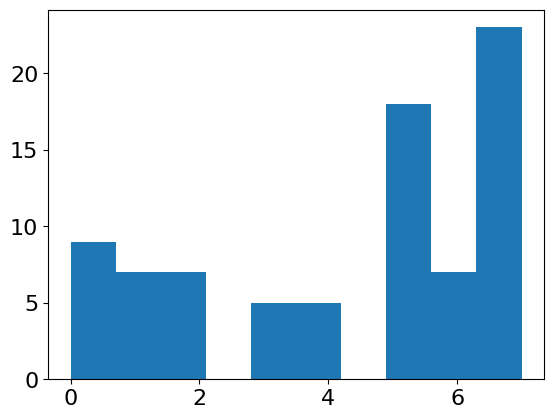

In [87]:
plt.hist(clusters)

# Visualize sessions

In [88]:
plot = False
target_length = 3

all_sequences = pd.DataFrame(columns=['sample', 'mouse_name', 'trial_type', 'cluster', 'bin'])
for s, sample in enumerate(trial_clusters['sample'].unique()):

    # Get session data and order trials
    session_data = trial_clusters.loc[trial_clusters['sample']==sample]
    session_data = session_data[['sample', 'mouse_name', 'trial_id', 'trial_type', 'cluster']].drop_duplicates()
    session_data['trial_id'] = session_data['trial_id'].astype(float)
    session_data = session_data.sort_values(by=['trial_id'])

    # Bin 
    n_trials = len(session_data)
    # Assign bin index: split into 10 parts
    bin_indices = pd.qcut(np.arange(n_trials), q=target_length, labels=False)
    session_data['bin'] = bin_indices
      
    all_sequences = pd.concat([all_sequences, session_data[['sample', 'mouse_name',
                                                            'trial_type', 'cluster', 'bin']]], ignore_index=True)
fractions = all_sequences.groupby(['sample', 'mouse_name',
                                   'bin'])['cluster'].value_counts(normalize=True).rename('fraction').reset_index().sort_values(by=['bin', 'cluster'])
fractions

,sample,mouse_name,bin,cluster,fraction
5,03063955-2523-47bd-ae57-f7489dd40f15 0.0,SWC_038,0,0,0.083333
25,03063955-2523-47bd-ae57-f7489dd40f15 1.0,SWC_038,0,0,0.111111
47,032452e9-1886-449d-9c13-0f192572e19f 0.0,SWC_053,0,0,0.044118
66,032452e9-1886-449d-9c13-0f192572e19f 1.0,SWC_053,0,0,0.104478
86,034e726f-b35f-41e0-8d6c-a22cc32391fb 0.0,CSHL045,0,0,0.154639
...,...,...,...,...,...
8115,fc43390d-457e-463a-9fd4-b94a0a8b48f5 1.0,NYU-47,2,6,0.114583
8132,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 0.0,CSH_ZAD_025,2,6,0.202532
8151,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 1.0,CSH_ZAD_025,2,6,0.197452
8171,ff96bfe1-d925-4553-94b5-bf8297adf259 0.0,ibl_witten_26,2,6,0.200000


In [89]:
error_clusters = pd.DataFrame({'error_cluster': clusters, 'mouse_name': named_labels})
error_clusters

,error_cluster,mouse_name
0,5,CSHL045
10,2,CSHL047
14,4,CSHL049
20,6,CSHL051
22,5,CSHL052
...,...,...
396,7,ibl_witten_20
398,7,ibl_witten_25
400,7,ibl_witten_26
408,7,ibl_witten_27


In [90]:
use_data = fractions.merge(error_clusters, on='mouse_name')
use_data

,sample,mouse_name,bin,cluster,fraction,error_cluster
0,03063955-2523-47bd-ae57-f7489dd40f15 0.0,SWC_038,0,0,0.083333,7
1,03063955-2523-47bd-ae57-f7489dd40f15 1.0,SWC_038,0,0,0.111111,7
2,032452e9-1886-449d-9c13-0f192572e19f 0.0,SWC_053,0,0,0.044118,7
3,032452e9-1886-449d-9c13-0f192572e19f 1.0,SWC_053,0,0,0.104478,7
4,034e726f-b35f-41e0-8d6c-a22cc32391fb 0.0,CSHL045,0,0,0.154639,5
...,...,...,...,...,...,...
8192,fc43390d-457e-463a-9fd4-b94a0a8b48f5 1.0,NYU-47,2,6,0.114583,0
8193,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 0.0,CSH_ZAD_025,2,6,0.202532,6
8194,ff48aa1d-ef30-4903-ac34-8c41b738c1b9 1.0,CSH_ZAD_025,2,6,0.197452,6
8195,ff96bfe1-d925-4553-94b5-bf8297adf259 0.0,ibl_witten_26,2,6,0.200000,7


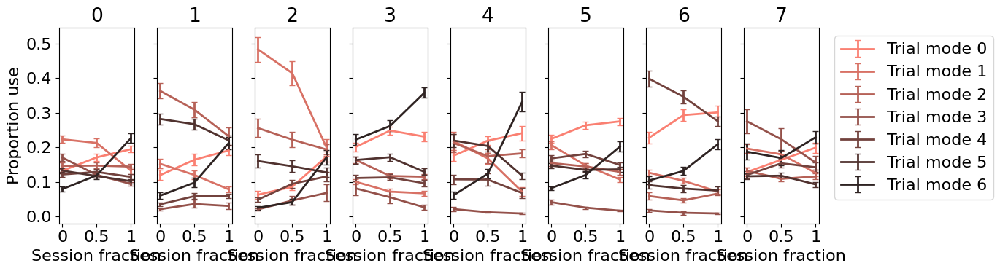

In [91]:
palette = sns.color_palette("dark:salmon_r", 7, as_cmap=False)
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.color_palette(palette).as_hex())


# fractions = all_sequences.groupby(['sample', 'part_cluster', 
#                                    'bin'])['cluster'].value_counts(normalize=True).rename('fraction').reset_index()
use_data = fractions.merge(error_clusters, on='mouse_name')

fig, axs = plt.subplots(1, k, sharex=True, sharey=True, figsize=(14, 4))

for phenotype in np.arange(0, k):

    # Group by bin and cluster, and compute mean and SEM
    summary = use_data.loc[use_data['error_cluster']==phenotype].groupby(['bin', 
                                                                           'cluster'])['fraction'].agg(['mean', 'sem']).reset_index()
    # Ensure correct types
    summary['bin'] = summary['bin'].astype(float)
    summary['cluster'] = summary['cluster'].astype(float)

    # Prepare plot
    plt.rc('font', size=16)

    clusters = sorted(summary['cluster'].unique())

    # Plot one line with error bars for each cluster
    for i, cluster in enumerate(clusters):
        cluster_data = summary[summary['cluster'] == cluster]
        axs[phenotype].errorbar(
            cluster_data['bin'], 
            cluster_data['mean'], 
            yerr=cluster_data['sem'], 
            label=f'Trial mode {int(cluster)}',
            color=my_cmap(i),
            capsize=3,
            linewidth=2
        )

    # Customize axes
    # axs[phenotype].set_xticks([0, 1, 2, 3, 4], [0, .25, .5, .75, 1])
    axs[phenotype].set_xticks([0, 1, 2], [0, .5, 1])
    # axs[phenotype].set_xticks(sorted(fractions['bin'].unique()))
    # axs[phenotype].set_xticklabels([str(int(b)) for b in sorted(fractions['bin'].unique())])
    axs[phenotype].set_xlabel('Session fraction')
    axs[phenotype].set_title(str(phenotype))
axs[0].set_ylabel('Proportion use')
axs[k-1].legend(loc='upper left', bbox_to_anchor=(1.1, 1))
plt.tight_layout()
plt.show()

# Visualize clusters

In [104]:
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})

cluster_df = pd.DataFrame(clusters)
cluster_df['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
cluster_df = cluster_df.rename(columns={0: 'mouse_cluster'})

trials = trials.merge(cluster_df, on=['mouse_number'])

In [184]:
wheel_0_mapping = {0:0, 1:1, 2:0, 3:0,
                 4:0, 5:1, 6:0, 7:0,
                 8:0, 9:1, 10:0, 11:0,
                 12:0, 13:1, 14:0, 15:0}
wheel_1_mapping = {0:0, 1:0, 2:1, 3:0,
                 4:0, 5:0, 6:1, 7:0,
                 8:0, 9:0, 10:1, 11:0,
                 12:0, 13:0, 14:1, 15:0}
wheel_2_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:1,
                 8:0, 9:0, 10:0, 11:1,
                 12:0, 13:0, 14:0, 15:1}
wheel_3_mapping = {0:1, 1:0, 2:0, 3:0,
                 4:1, 5:0, 6:0, 7:0,
                 8:1, 9:0, 10:0, 11:0,
                 12:1, 13:0, 14:0, 15:0}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}


## With error bars

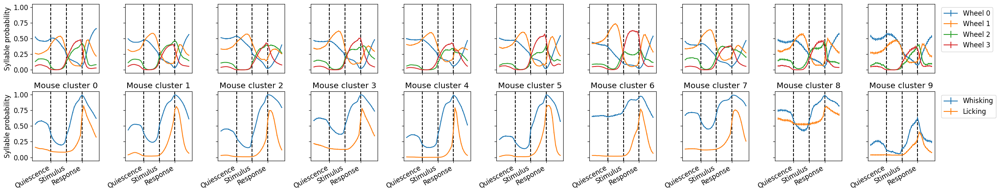

In [187]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(2, np.max(clusters)+1, sharex=True, sharey=True, figsize=(25, 5))

for c, cluster in enumerate(np.arange(0, np.max(clusters)+1)):
    
    cluster_data = trials.loc[trials['mouse_cluster']==cluster]
    use_sequences = np.array(cluster_data.drop(columns=['mouse_name', 'mouse_number', 'mouse_cluster']))

    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel_0 = np.vectorize(wheel_0_mapping.get)
    replace_wheel_1 = np.vectorize(wheel_1_mapping.get)
    replace_wheel_2 = np.vectorize(wheel_2_mapping.get)
    replace_wheel_3 = np.vectorize(wheel_3_mapping.get)
    wheel_state_0 = replace_wheel_0(use_smouse_distance_dfences)
    
    
    # Mean
    whisker_count = np.mean(whisker_states, axis=0)
    lick_count = np.mean(lick_states, axis=0)
    wheel_count_0 = np.mean(wheel_state_0, axis=0)
    wheel_count_1 = np.mean(wheel_state_1, axis=0)
    wheel_count_2 = np.mean(wheel_state_2, axis=0)
    wheel_count_3 = np.mean(wheel_state_3, axis=0)
        
    all_stacked = np.vstack([wheel_count_0, wheel_count_1, wheel_count_2, wheel_count_3,
                             whisker_count, lick_count])

    # Error
    whisker_error = np.std(whisker_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    lick_error = np.std(lick_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_0 = np.std(wheel_state_0, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_1 = np.std(wheel_state_1, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_2 = np.std(wheel_state_2, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_3 = np.std(wheel_state_3, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
        
    all_error_stacked = np.vstack([wheel_error_0, wheel_error_1, wheel_error_2, wheel_error_3, 
                                   whisker_error, lick_error])
    
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[0:1, :][0], yerr=all_error_stacked[0:1, :][0], label='Wheel 0')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[1:2, :][0], yerr=all_error_stacked[1:2, :][0], label='Wheel 1')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[2:3, :][0], yerr=all_error_stacked[2:3, :][0], label='Wheel 2')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[3:4, :][0], yerr=all_error_stacked[3:4, :][0], label='Wheel 3')
      
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[4:5, :][0], yerr=all_error_stacked[4:5, :][0], label='Whisking')
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[5:6, :][0], yerr=all_error_stacked[5:6, :][0], label='Licking')
mouse_distance_dfinestyle='--')
    axs[1, c].axvline(x=10, color='k', linestyle='--')
    axs[1, c].axvline(x=20, color='k', linestyle='--')
    axs[1, c].axvline(x=30, color='k', linestyle='--')

    axs[1, c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[1, c].set_title('Mouse cluster ' +str(cluster))
axs[0, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[1, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0, 0].set_ylabel('Syllable probability')
axs[1, 0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()


## Analyze entropy across trial per animal

In [ ]:
trials = pd.DataFrame(binarized)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})
trials = trials.merge(diagonal, on=['mouse_number'])

Text(0.5, 0, 'Decoding accuracy')

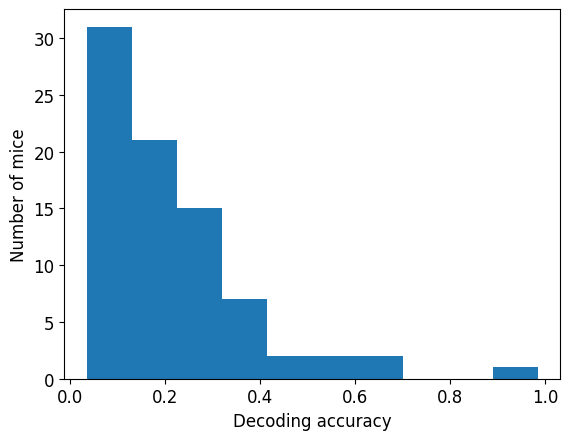

In [206]:
plt.hist(diagonal['accuracy'])
plt.ylabel('Number of mice')
plt.xlabel('Decoding accuracy')

In [186]:
entropy_df = pd.DataFrame(columns=['mouse_name',  'accuracy', 'bin', 'entropy'])

for m, mouse in enumerate(trials['mouse_name'].unique()):
    
    use_df = trials.loc[trials['mouse_name']==mouse]
    state_probs = np.mean(use_df.drop(columns=['mouse_name', 'mouse_number', 'accuracy']), axis=0)
    
    mouse_entropy = pd.DataFrame(columns=['mouse_name', 'accuracy', 'bin', 'entropy'], index=range(timesteps))
    mouse_entropy['mouse_name'] = mouse
    mouse_entropy['accuracy'] = list(use_df['accuracy'])[0]
    
    for t in range(timesteps):
        # label_binarizer = LabelBinarizer()
        # label_binarizer.fit(range(use_states))
        # encoded_arr = label_binarizer.transform(use_sequences[:, t])
        bin_data = state_probs[t*16:(t+1)*16]
        ent = entropy(bin_data)/np.log(16)
        mouse_entropy['entropy'][t] = ent
        mouse_entropy['bin'][t] = t
        
    entropy_df = pd.concat([entropy_df, mouse_entropy])
        
    

/tmp/ipykernel_19502/2226901285.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  mouse_entropy['entropy'][t] = ent
/tmp/ipykernel_19502/2226901285.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [210]:
entropy_df['accuracy_type'] = entropy_df['accuracy']
entropy_df.loc[entropy_df['accuracy_type']<.05, 'accuracy_type'] = 0
entropy_df.loc[entropy_df['accuracy_type']>.3, 'accuracy_type'] = 2
entropy_df.loc[(entropy_df['accuracy_type']>.05) &
               (entropy_df['accuracy_type']<.3), 'accuracy_type'] = 1



Text(0.5, 0, 'Trial events')

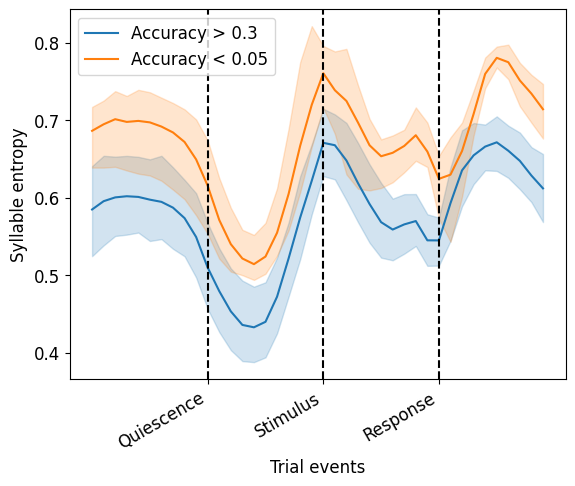

In [220]:
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']>.3], label='Accuracy > 0.3')
# sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[(entropy_df['accuracy']>.05) &
#                                                        (entropy_df['accuracy']<.3)])
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']<.05], label='Accuracy < 0.05')


plt.axvline(x=10, color='k', linestyle='--')
plt.axvline(x=20, color='k', linestyle='--')
plt.axvline(x=30, color='k', linestyle='--')

plt.xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.ylabel('Syllable entropy')
plt.xlabel('Trial events')

## Vizualize results

In [216]:
wheel_mapping = {0:0, 1:1, 2:2, 3:3,
                 4:0, 5:1, 6:2, 7:3,
                 8:0, 9:1, 10:2, 11:3,
                 12:0, 13:1, 14:2, 15:3}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}
replace_wheel = np.vectorize(wheel_mapping.get)
# wheel_states = replace_wheel(use_sequences)
replace_whisker = np.vectorize(whisker_mapping.get)
# whisker_states = replace_whisker(use_sequences)
replace_lick = np.vectorize(lick_mapping.get)

In [ ]:
# select mice with very good decoding or bad

/tmp/ipykernel_19502/2601245174.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


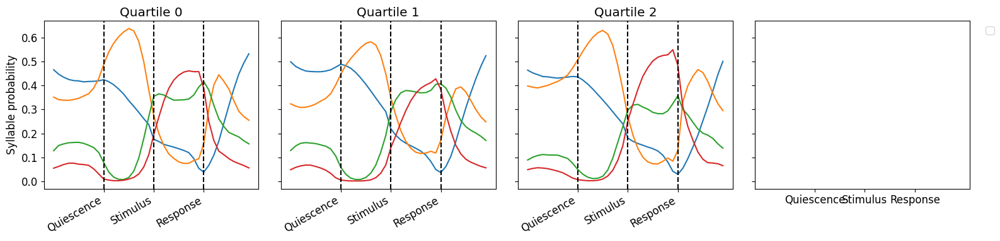

In [217]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[0:4, :].T, label=['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()

/tmp/ipykernel_19502/1841012585.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


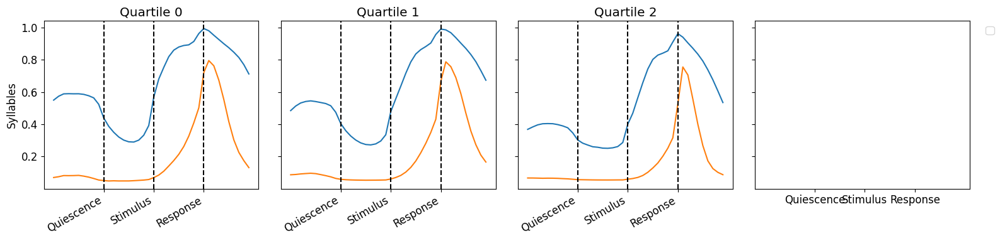

In [218]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[4:6, :].T, label=['Whisking', 'Licking'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllables')
plt.tight_layout()
plt.show()